# Хакатон Яндекс.Музыка

## Описание

### Что необходимо сделать?

Обнаружение треков каверов - важная продуктовая задача, которая может значительно улучшить качество рекомендаций музыкального сервиса и повысить счастье наших пользователей. Если мы умеем с высокой точностью классифицировать каверы и связывать их между собой, то можно предложить пользователю новые возможности для управления потоком треков. Например:

- по желанию пользователя можем полностью исключить каверы из рекомендаций;
- показать все каверы на любимый трек пользователя;
- контролировать долю каверов в ленте пользователя.

В этом хакатоне вам предлагается разработать решение, которое:

- может классифицировать треки по признаку кавер-некавер;
- связывать (группировать) каверы и исходный трек;
- находит исходный трек в цепочке каверов.

Совсем не обязательно, чтобы ваше решение умело делать все три функции. Будет уже здорово, если вы сможете придумать решение хотя бы для одной задачи.

Для решения этой задачи вы можете использовать любые открытые источники данных и собирать необходимую вам информацию, соблюдая правила использования сервисов, которые эту информацию предоставляют.

### Разметка каверов

Файл covers.json содержит разметку каверов, сделанную редакторами сервиса:

- track_id - уникальный идентификатор трека;
- track_remake_type - метка, присвоенная редакторами. Может принимать значения ORIGINAL и COVER;
- original_track_id - уникальный идентификатор исходного трека.

### Метаинформация

- track_id - уникальный идентификатор трека;
- dttm - первая дата появления информации о треке;
- title - название трека;
- language - язык исполнения;
- isrc - международный уникальный идентификатор трека;
- genres - жанры;
- duration - длительность трека

### Текст песен

- track_id - уникальный идентификатор трека;
- lyricId - уникальный идентификатор текста;
- text - текст трека.

## Полезные ссылки

- [https://musicbrainz.org](https://musicbrainz.org/)
- [https://acousticbrainz.org](https://acousticbrainz.org/)
- https://github.com/andreamust/MusicMetaLinker

#  Импорт библиотек и загрузка данных

In [1]:
#!pip install catboost
#!pip install shap
#!pip install phik
#!pip install faiss-cpu
#!pip install diameter-clustering
#!pip install sentence_transformers

In [2]:
#!pip install musicbrainzngs
#!git clone https://github.com/alastair/python-musicbrainzngs.git

#Подключаем MusicMetaLinker
#!git clone https://github.com/andreamust/MusicMetaLinker.git
#!cd MusicMetaLinker
#!pip install -r MusicMetaLinker/requirements.txt

In [3]:
#!pip install -U sentence-transformers

In [4]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve, accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.utils import compute_class_weight

import phik
from phik.report import plot_correlation_matrix

from catboost import CatBoostClassifier
#from lightgbm import LGBMClassifier

import shap

import faiss
from faiss import write_index, read_index

#from MusicMetaLinker.linking import linking
#import musicbrainzngs

import json
import csv
from datetime import datetime
import time

import plotly.express as px
import plotly.graph_objs as go

from diameter_clustering import LeaderClustering
import torch
import torch.nn.functional as F
from sentence_transformers import SentenceTransformer, util

os.environ['PYTHONWARNINGS'] = 'ignore'
#from google.colab import drive
#drive.mount('/content/drive')

import warnings
warnings.filterwarnings("ignore")

# Константы

In [5]:
random_state = np.random.RandomState(42)
STATE = 102023
CUR_YEAR = datetime.now().year
#Colab
PTH1 = '/content/drive/MyDrive/ya.music/'
# Local
PTH2 = '' 

# Используемые функции

In [6]:
#Функция загрузки данных по пути файлов json
def load_files(pth1=PTH1, pth2=PTH2, mode=1):
    files = ['covers.json',
             'lyrics.json',
             'meta.json']
    names = ['covers',
             'lyrics',
             'meta']
    for name, file in zip(names, files):
        if os.path.exists(pth1 + file):
            df = pd.read_json(pth1 + file,lines=True)
        elif os.path.exists(pth2 + file):
            df = pd.read_json(pth2 + file,lines=True)
        else:
            print('Something is wrong')
            continue
        if mode == 2: 
            globals()[name] = df
#    if 'dttm' in df.columns:
#        df['dttm']  = df['dttm'] / 1000
#        df['dttm'] = pd.to_datetime(df['dttm'],unit='s')
    if mode == 1:
        return covers, lyrics, meta

In [7]:
#Создение дополнительных признаков из жанров
def creat_genre_data(data):
    track_genres = (data[['track_id',
                          'title',
                          'genres']].explode('genres')
                                    .fillna('unknown_genre')
                                    .pivot_table(index='track_id',
                                                columns='genres',
                                                values='title',
                                                aggfunc='count')
                                    .fillna(0))

    for col in track_genres.columns:
        track_genres[col] = track_genres[col].astype('int')
    return track_genres

In [8]:

#meta['dttm_year'] = meta['dttm'].apply(lambda x: datetime.utcfromtimestamp(x/1000).strftime('%Y'))

In [9]:
#Загружаем данные и сливаем их в один
def upload_data() -> pd.DataFrame:
    #Загружем
    covers, lyrics, meta = load_files()

    #Сперва соединим meta и covers по общим ключам
    data_meta_covers = pd.merge(meta, covers, on="track_id", how='inner')

    #Соединим предыдущий шаг с lyrics по ключам из lyrics
    data = pd.merge(data_meta_covers, lyrics, on="track_id", how='right')

    #Создаем признаки из жанров
    track_genres = creat_genre_data(data)
    #Сольём их снова
    data = pd.merge(data, track_genres, on="track_id", how='left')

    #Разбираем isrc на признаки
    add_isrc_features(data)

    #Уберем лишние признаки, заполним пропуски и преобразуем dttm
    #clean_data(data)
    #Удалим дубликаты по isrc
    #data.drop_duplicates(subset='isrc', inplace=True)

    #Удалим пропуски по разметке track_remake_type, так как они ненужны
    data = data.dropna(subset='track_remake_type')
    return data

In [10]:
# Поиск года в заголовках
def year_title(title, cur_year=CUR_YEAR):
    first_year = cur_year - 99
    year = None
    for i in range(first_year, cur_year+1, 1):
        if title.find(str(i)) >=0:
            if year == None:
                year = i
            else:
                return None
    return str(year)

In [11]:
# Создание признаков год в заголовке и 'cover' в заголовке
def year_cover_from_title(meta):
    meta['title_cover'] = meta['title'].apply(lambda x: 1 if (re.sub('[^a-zA-Z0-9\n\.]', ' ', x).lower().find(' cover') >=0) else 0)
    meta['title_year'] = meta['title'].apply(year_title).fillna('unknown')
    meta['len_title'] = meta['title'].apply(lambda x: len(x)).fillna(0)
    return meta

In [12]:
# конвертация unix формата времени в дату
def unix_date(sec):
    return datetime.utcfromtimestamp(sec/1000).strftime('%d.%m.%Y')

In [13]:
def unix_ym(sec):
    return datetime.utcfromtimestamp(sec/1000).strftime('%Y-%m')

In [14]:
#В признаке isrc могут быть ошибки, поэтому необходимо проверить формат
def correct_isrc(isrc):
    if isrc == None:
        return False
    pattern = r'^[A-Z]{2}\w{3}\d{2}\d{5}$'
    match = re.fullmatch(pattern, isrc)
    if match:
        return True
    else:
        return False

In [15]:
#Создание признаков из isrc
def add_isrc_features(data: pd.DataFrame, cur_year=CUR_YEAR):
    data['isrc'].fillna('unknown', inplace=True)
    data['isrc_country_code'] = data['isrc'].dropna().apply(lambda x: str(x)[:2] if correct_isrc(x) else 'unknown')
    data['isrc_issuer'] = data['isrc'].dropna().apply(lambda x: str(x)[2:5] if correct_isrc(x) else 'unknown')
    data['isrc_issuer_full'] = data['isrc'].dropna().apply(lambda x: str(x)[:5] if correct_isrc(x) else 'unknown')
    data['isrc_year'] = data['isrc'].dropna() \
                                    .apply(lambda x: 'unknown' if not correct_isrc(x)
                                                               else('19'+x[5:7] if (int(x[5:7]) > int(str(CUR_YEAR)[2:]))
                                                               else '20'+x[5:7] ))

    #data.loc[data['isrc_year'] == 'unknown', 'isrc_year'] = 0
    #Пока поставим год как категорию
    data['isrc_country_code'] =  data['isrc_country_code'].astype('category')
    data['isrc_issuer'] =  data['isrc_issuer'].astype('category')
    data['isrc_issuer_full'] =  data['isrc_issuer_full'].astype('category')
    data['isrc_year'] =  data['isrc_year'].astype('category')

In [16]:
#Чистим и подготавливаем данные
def clean_data(data: pd.DataFrame):
    #Удаляем признаки original_track_id и lyricId
    data.drop(columns=['original_track_id', 'lyricId'], inplace=True)
    #Все пропуски заполняем unknown
    meta['language'] = meta.groupby("isrc")['language'] \
                       .transform(lambda x: x.fillna(x.value_counts().index[0]) if x.value_counts().shape[0] != 0 else x)
    data['language'].fillna('unknown', inplace=True)
    #Преобразуем dttm
    data['dttm'] = pd.to_datetime(data['dttm']/ 1000,unit='s')

In [17]:
#Формируем тестовый датасет
def create_test_data(data: pd.DataFrame) -> pd.DataFrame:
    #Копируем, чтобы не изменять оригинал
    new_data = data.copy()

    #Почистим исходный датасет
    clean_data(data)

    #Отделяем каверы с известными оригиналами для которых ответы есть в датасете
    data_with_answer = new_data[(~new_data['original_track_id'].isna()) &
                                    (new_data['track_remake_type'] == 'COVER') &
                             (new_data['original_track_id'].isin(new_data['track_id'].tolist()))]

    #Сохраним track_id каверов для которых достоверно есть оригинал
    track_id_cover = data_with_answer['track_id'].tolist()

    #Сохраним original_track_id оригиналов для которых достоверно есть кавер
    track_id_original = data_with_answer['original_track_id'].tolist()

    answer ={**{k: a for k, a in zip(track_id_cover, track_id_original)},
             **{k: a for k, a in zip(track_id_original, track_id_cover)}}
    #Сформируем тестовый датасет
    test_dataset = new_data[(new_data['track_id'].isin(track_id_cover)) |
                           (new_data['track_id'].isin(track_id_original))]



    #Почистим тренировочный датасет
    clean_data(test_dataset)

    return test_dataset, answer

In [18]:
def get_embedding(text):
  #model = SentenceTransformer('all-MiniLM-L6-v2')
  return sbert.encode(text,convert_to_tensor=True)

In [19]:
#Наша метрика, точность нахождения правильного ответа в n кандидатах
def accuracy_at_n(test, data, indexes, answer, return_res=False):
    acc = 0
    for index, target in zip(indexes, test['track_id'].tolist()):
        if answer[target] in data.iloc[index]['track_id'].tolist():
            acc += 1
    if return_res == False:
        print(f"Accuracy@n  = {round(100 * acc / len(test['track_id'].tolist()), 3)}%")
    else:
        return round(100 * acc / len(test['track_id'].tolist()), 3)

# Импорт данных

In [20]:
load_files(mode=2)

# EDA и анализ

## Covers

In [21]:
covers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71597 entries, 0 to 71596
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   original_track_id  4821 non-null   object
 1   track_id           71597 non-null  object
 2   track_remake_type  71597 non-null  object
dtypes: object(3)
memory usage: 1.6+ MB


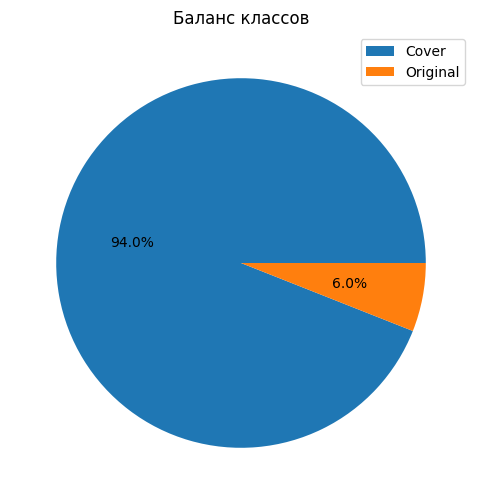

In [22]:
(covers.groupby('track_remake_type')
       .count()['track_id']
       .plot(kind='pie',
             autopct='%1.1f%%',
             figsize=(6,6),
             labels = None)
)
plt.legend(['Cover', 'Original'])
plt.title('Баланс классов')
plt.ylabel('')
plt.show()

In [23]:
#Количесвто пропусков в original_track_id
covers.isna().sum()

original_track_id    66776
track_id                 0
track_remake_type        0
dtype: int64

In [24]:
covers.shape

(71597, 3)

In [25]:
#Соотнешения каверов и оригиналов для достоверно известных ответов
covers[~covers['original_track_id'].isna()]['track_remake_type'].value_counts()

track_remake_type
ORIGINAL    4293
COVER        528
Name: count, dtype: int64

In [26]:
#Количесвто уникальных треков в файле covers
len(covers['track_id'].unique())

71597

In [27]:
#Количесвто уникальных треков в файле lyrics
len(lyrics['track_id'].unique())

10277

## lyrics

In [28]:
lyrics.info()
lyrics.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11414 entries, 0 to 11413
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   lyricId   11414 non-null  object
 1   text      11414 non-null  object
 2   track_id  11414 non-null  object
dtypes: object(3)
memory usage: 267.6+ KB


,lyricId,text,track_id
0,a951f9504e89759e9d23039b7b17ec14,"Живу сейчас обломами, обломками не той любви\n...",1c4b1230f937e4c548ff732523214dcd
1,0c749bc3f01eb8e6cf986fa14ccfc585,Tell me your fable\nA fable\nTell me your fabl...,0faea89b0d7d6235b5b74def72511bd8
2,e2c8830fbc86e5964478243099eec23a,You're ashamed about all your fears and doubts...,9c6dc41d5ccd9968d07f055da5d8f741
3,e2c8830fbc86e5964478243099eec23a,You're ashamed about all your fears and doubts...,bfd04a73e9cffdf0e282c92219a86ea1
4,7624653ca8522ba93470843c74961b7d,"You showed him all the best of you,\nBut I'm a...",8d70930d09cd239c948408d1317d8659


In [29]:
# пропуски
lyrics.isna().sum()

lyricId     0
text        0
track_id    0
dtype: int64

In [30]:
lyrics.nunique()


lyricId     10915
text        10644
track_id    10277
dtype: int64

Во всех столбцах есть повторы.<br> Рассмотрим полностью повторяющиеся строки

In [31]:
lyrics.duplicated().sum()

0

Одному треку может соответствовать лишь один текст, но при этому текст может соответствовать нескольким трекам.<br>
Посмотрим сколько у нас дубликатов с разными lyricId. Удалим дубликаты.

In [32]:
display(lyrics[['text', 'track_id']].duplicated().sum())

264

Рассмотрим сколько разных текстов относятся к одному track_id.<br>
Создадим столбец "длина текста" и количество строк в тексте.

In [33]:
lyrics = lyrics[~lyrics[['text', 'track_id']].duplicated()]

In [34]:
display(lyrics[['track_id']].duplicated().sum())
lyrics['len_text'] = lyrics['text'].apply(lambda x: len(x)).fillna(0)
lyrics['count_rows_text'] = lyrics['text'].apply(lambda x: len(x.split('\n'))).fillna(0)
lyrics[lyrics[['track_id']].duplicated(keep=False)].sort_values(by='track_id')

873

,lyricId,text,track_id,len_text,count_rows_text
10676,745f700051961898c65ffdafd9793584,Hearts go astray\nLeaving hurt when they go\nI...,0021519c8533f1116591948bbb349aef,1765,100
10681,039236cf5355b4a81a7d5e689dbbf00a,Hearts go astray\nLeaving hurt when they go\nI...,0021519c8533f1116591948bbb349aef,1748,83
4796,9ee5ee7522b5b6d045a2d276a040d00c,"If I stay with you, if I'm choosing wrong\nI d...",0102189356af15ad0be804eddd9bc24a,532,21
9220,6e3781576e60cfbee15f65d626ac130a,"If I stay with you, if I'm choosing wrong\nI d...",0102189356af15ad0be804eddd9bc24a,779,31
11306,1682f991cfa94d1440bef2aa417edec7,"If I stay with you, if I'm choosing wrong\nI d...",0102189356af15ad0be804eddd9bc24a,852,32
...,...,...,...,...,...
4814,0e36ae7acbfee10d69cb8668b77f6403,This night is cold in the kingdom\nI can feel ...,ff032309afbd44985497077e1f041e97,1926,57
7556,6ba951bfe34b90ab611f63c67caa708f,This night is cold in the kingdom\nI can feel ...,ff032309afbd44985497077e1f041e97,1905,66
8895,c8af153ec09b0a087e79a0f77f7310bd,Don't go tonight\nStay here one more time\nRem...,ff77df3ccccd54654ea4b2209dd6e38c,791,24
8881,d9107cc98fb6dc91853ea69ac98f1d58,Don't go tonight\nStay here one more time\nRem...,ff77df3ccccd54654ea4b2209dd6e38c,801,28


Рассмотрим как сильно отличается текст по количеству символов

In [35]:
lyrics['len_text'].describe(percentiles=[.10, .90, .98])

count    11150.000000
mean      1248.381794
std        556.146789
min         13.000000
10%        650.000000
50%       1165.000000
90%       1925.100000
98%       2702.060000
max       8163.000000
Name: len_text, dtype: float64

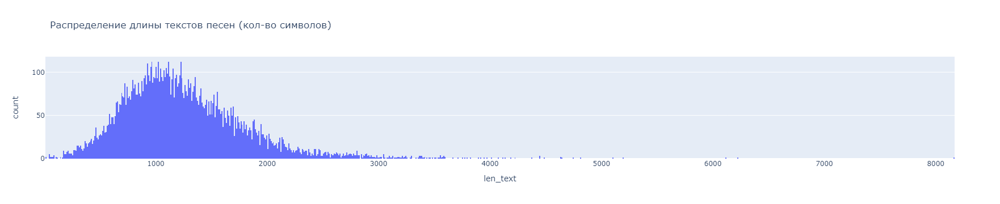

In [36]:
# Строим гистограмму
fig = px.histogram(lyrics['len_text'], 
                   x=lyrics['len_text'].name, 
                   nbins=1000,
                   title='Распределение длины текстов песен (кол-во символов)')

# Отображаем график
fig.show()

Выведем аномально короткий и аномально длинный текст

In [37]:
display(lyrics[lyrics['len_text'] == 13]['text'].values)
print()
lyrics[lyrics['len_text'] == 8163]['text'].values[0][:3000]

array(['The Simpsons!'], dtype=object)

'Instagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\nInstagram: rebelofficialx\n

Как видим некоторые тексты песен некорректные

In [38]:
(lyrics[lyrics[['track_id']].duplicated(keep=False)][['track_id', 'len_text']]
                            .groupby('track_id')
                            .agg(['min', 'max', 'std', 'count'])
                            .sort_values(by=('len_text', 'std'), ascending=False)
)

len_text                         
                                      min   max          std count
track_id                                                          
a4af115abce62bd2e50d3fc4e9cf91ea     1161  3390  1576.141015     2
07e9a06bbbef7e0b6f84ba92665ecb44     2222  4116  1339.260244     2
a2b4648b3e4c261605bc3be519607308     1026  2885  1314.511506     2
d5c149b59a800a6f9f61adda6d3e1b1d      764  2429  1177.332791     2
10463f622a537e2d3c3309d7f41e7dae     1000  3049  1005.700751     4
...                                   ...   ...          ...   ...
d6f6d383ad031e1c84ce7bdbc082e4d3      942   942     0.000000     2
8ed9637462282754c368965288ba3426      941   941     0.000000     2
63e0b4fbf67cfe5ebfa5f94186a9dda0      502   502     0.000000     2
ee576d0879fc1a2c68ebc758c799a64b     1811  1811     0.000000     2
d93b89d3a76432ce4dd864af47647966      984   984     0.000000     2

[584 rows x 4 columns]

Рассмотрим идентификатор a4af115abce62bd2e50d3fc4e9cf91ea, у которого текст песни сильно отличается по длине.

In [39]:
lyrics[lyrics['track_id'] == 'a4af115abce62bd2e50d3fc4e9cf91ea'][['text', 'len_text']]

,text,len_text
3198,I feel so unsure\nAs I take your hand and lead...,3390
5453,I feel so unsure\nAs I take your hand and lead...,1161


In [40]:
len(lyrics.loc[3198]['text'].split('\n'))

109

In [41]:
print(lyrics.loc[3198]['text'])

I feel so unsure
As I take your hand and lead you to the dancefloor
As the music dies, something in your eyes
Calls to mind the silver screen
And all it's sad goodbyes

I'm never gonna dance again (no no)
Guilty feet have got no rhythm
Though it's easy to pretend
I know your not a fool (you and you alone)
Shoulda known better than to cheat a friend(shoulda known)
Waste this chance that I've been given
No I'm never gonna dance again
The way I danced with you

Do you love me as I move girl
Baby give my life up to you girl
The one that couldn't bump us for you girl
The girl can't compare to me when you live my lifes and nightmares
Just one last time

So baby baby one more chance
Your love and the sweetest romance
Just one last time, without you girl I'm blind and a record label that's mine
Sing again

Time can never mend, no
The careless whispers of a good friend
To the heart and mind
Ignorance is kind
There's no comfort in the truth
Pain is all you'll find

I'm never gonna dance again
Gu

In [42]:
print(lyrics.loc[5453]['text'])

I feel so unsure
As I take your hand and lead you to the dancefloor
As the music dies, something in your eyes
Calls to mind the silver screen
And all those sad goodbyes
I'm never gonna dance again
Guilty feet have got no rhythm
Though it's easy to pretend
I know your not a fool
Shoulda known better than to cheat a friend
And waste this chance that I've been given
So I'm never gonna dance again
The way I danced with you

Time can never mend
The careless whispers of a good friend
To the heart and mind
Ignorance is kind
There's no comfort in the truth
Pain is all you'll find

I'm never gonna dance again
Guilty feet have got no rhythm (rhythm no)
Though it's easy to pretend
I know your not a fool (no, no,)
Shoulda known better than to cheat a friend
Than waste this chance that I've been given
So I'm never gonna dance again
The way I danced with you

We could have been so good together
We could have made this last forever
But now who's gonna dance with me?
Please stay
Stay, stay, stay
I can

Вероятнее всего текст сокращенный и полный. Оставим самые длинные тексты песен.

In [43]:
# Сортировка по длине по убыванию и отсекание более коротких
lyrics.sort_values(by='len_text', ascending=False, inplace=True)
lyrics = lyrics[~lyrics['track_id'].duplicated()]

## Meta

In [44]:
meta.info()
meta.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71769 entries, 0 to 71768
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   track_id  71768 non-null  object 
 1   dttm      71768 non-null  float64
 2   title     71768 non-null  object 
 3   language  21969 non-null  object 
 4   isrc      71455 non-null  object 
 5   genres    71768 non-null  object 
 6   duration  71768 non-null  float64
dtypes: float64(2), object(5)
memory usage: 3.8+ MB


,track_id,dttm,title,language,isrc,genres,duration
0,c3b9d6a354ca008aa4518329aaa21380,1.639688e+12,Happy New Year,EN,RUB422103970,[DANCE],161120.0
1,c57e3d13bbbf5322584a7e92e6f1f7ff,1.637762e+12,Bad Habits,EN,QZN882178276,[ELECTRONICS],362260.0
2,955f2aafe8717908c140bf122ba4172d,1.637768e+12,Por Esa Loca Vanidad,None,QZNJZ2122549,"[FOLK, LATINFOLK]",260000.0
3,fae5a077c9956045955dde02143bd8ff,1.637768e+12,Mil Lagrimas,None,QZNJZ2166033,"[FOLK, LATINFOLK]",190000.0
4,6bede082154d34fc18d9a6744bc95bf5,1.637768e+12,Sexo Humo y Alcohol,None,QZNJZ2122551,"[FOLK, LATINFOLK]",203000.0


In [45]:
# кол-во уникальных значений
meta[['track_id', 'dttm', 'title', 'isrc', 'duration']].nunique()

track_id    71768
dttm        27726
title       45462
isrc        71283
duration    23597
dtype: int64

In [46]:
meta.isna().sum()

track_id        1
dttm            1
title           1
language    49800
isrc          314
genres          1
duration        1
dtype: int64

Удалим полностью пустую строку

In [47]:
meta.dropna(subset=['track_id'], inplace=True)

### Языки

In [48]:
meta['language'].value_counts().head(20)

language
EN    15322
ES     1747
RU     1558
IT      907
HI      285
DE      238
ZH      212
FR      210
JA      174
VI      162
TH      162
PT      114
ID      111
PA       50
SI       49
TA       49
ML       47
TR       43
AR       41
PL       35
Name: count, dtype: int64

Заполним возможные пропуски внутригрупповым значением, для треков с одинаковым isrc.

In [49]:
# заполнение самыми высокочастотными внутрегрупповыми (по ISRC) значениями
meta['language'] = meta.groupby("isrc")['language'] \
                       .transform(lambda x: x.fillna(x.value_counts().index[0]) if x.value_counts().shape[0] != 0 else x)

Заполним пропуски значением 'unknown'.

In [50]:
meta['isrc'].fillna('unknown', inplace=True)

### Рассмотрим столбец title


In [51]:
meta['title'].value_counts().head(20)

title
Morena                     81
Smooth Criminal            75
Rolê                       72
Wicked Game                67
Esquema Preferido          66
Meia Noite                 57
Facas                      57
Perfect                    53
Smells Like Teen Spirit    53
Ficha Limpa                51
Baby Me Atende             51
Wonderwall                 50
Toxic                      49
Stay                       47
Romance Desapegado         47
Acaso                      46
Blinding Lights            45
A Maior Saudade            43
Creep                      42
Baby One More Time         41
Name: count, dtype: int64

Добавим новые признаки:<br>
1) Наличие слова cover в заголовке<br>
2) Наличие года (в единственном экземляре) в заголовке
3) Длина заголовка

In [52]:
meta = year_cover_from_title(meta)

### Посмотрим на жанры

In [53]:
meta['genres'].explode().unique()

array(['DANCE', 'ELECTRONICS', 'FOLK', 'LATINFOLK', 'JAZZ', 'CONJAZZ',
       'POP', 'SOUL', 'RNB', 'PUNK', 'ROCK', 'ALLROCK', 'ALTERNATIVE',
       'SOUNDTRACK', 'SPIRITUAL', 'CLASSICMETAL', 'METAL', 'RNR',
       'ANIMEMUSIC', 'ESTRADA', 'HOUSE', 'RUSPOP', 'FOREIGNBARD', 'BARD',
       'CLASSICAL', 'CLASSICALMUSIC', 'FOREIGNRAP', 'RAP', 'COUNTRY',
       'RUSRAP', 'AMBIENTGENRE', 'REGGAE', 'REGGAETON', 'CHILDREN', nan,
       'BLUES', 'VOCAL', 'RUSROCK', 'AFRICAN', 'INDIE', 'FOLKROCK',
       'ASIAPOP', 'NEWAGE', 'CAUCASIAN', 'EASTERN', 'FORCHILDREN',
       'RELAX', 'SKA', 'BLACKMETAL', 'DNB', 'DISCO', 'PROGMETAL',
       'AMERFOLK', 'LOCAL-INDIE', 'PHONKGENRE', 'VIDEOGAME', 'FAIRYTALES',
       'RUSESTRADA', 'DEATHMETAL', 'NEWWAVE', 'HARDROCK',
       'ALTERNATIVEMETAL', 'FUNK', 'HARDCORE', 'JAPANESEPOP', 'BOLLYWOOD',
       'POSTHARDCORE', 'EXPERIMENTAL', 'KPOP', 'MODERN', 'EXTREMEMETAL',
       'FOLKGENRE', 'HYPERPOPGENRE', 'EDMGENRE', 'GOTHICMETAL',
       'FOLKMETAL', 'TRANCE',

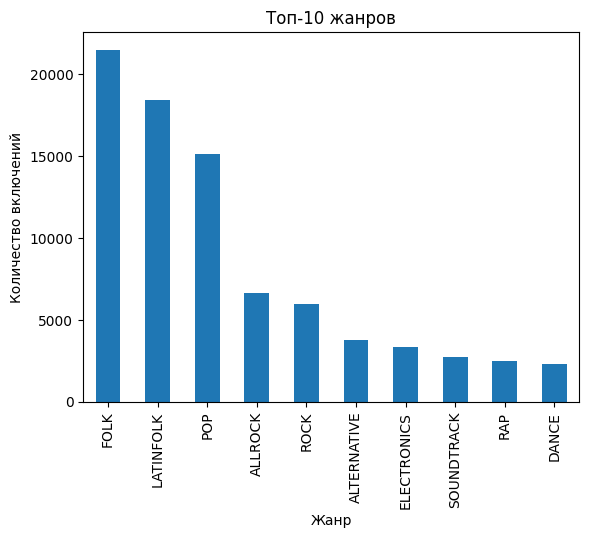

In [54]:
top_10 = meta['genres'].explode().value_counts(ascending=False).head(10)

top_10.plot(kind='bar')
plt.title('Топ-10 жанров')
plt.xlabel('Жанр')
plt.ylabel('Количество включений')
plt.show()

Присутствуют пропуски.<br>
Так как каждому треку может относиться несколько жанров, создадим для каждого track_id таблицу признаков, которыми будут являться жанры<br>


#### Создание признаков-жанров

In [55]:
track_genres = creat_genre_data(meta)
track_genres.head()

genres,AFRICAN,ALLROCK,ALTERNATIVE,ALTERNATIVEMETAL,AMBIENTGENRE,AMERFOLK,ANIMATED,ANIMEMUSIC,ARABESQUEMUSIC,ARABICPOP,...,TURKISHPOP,TURKISHRAP,TURKISHROCK,TVSERIES,UKRROCK,UZBEKPOP,VIDEOGAME,VOCAL,VOCALJAZZ,unknown_genre
track_id,,,,,,,,,,,,,,,,,,,,,
0000757a652c12554a82002cd90cc10a,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
00017038a565df4b72048268e7623599,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0002e85381698128b8b2a0f578ac2054,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0003734c0dce387667e659709b20934e,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
000545f7357ee9a4bd1438505406875c,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [56]:
meta['count_genres'] = meta['genres'].apply(lambda x: len(x)).fillna(0)

### Посмотрим на столбец времени dttm

In [57]:
meta.info()

<class 'pandas.core.frame.DataFrame'>
Index: 71768 entries, 0 to 71768
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   track_id      71768 non-null  object 
 1   dttm          71768 non-null  float64
 2   title         71768 non-null  object 
 3   language      22047 non-null  object 
 4   isrc          71768 non-null  object 
 5   genres        71768 non-null  object 
 6   duration      71768 non-null  float64
 7   title_cover   71768 non-null  int64  
 8   title_year    71768 non-null  object 
 9   len_title     71768 non-null  int64  
 10  count_genres  71768 non-null  int64  
dtypes: float64(2), int64(3), object(6)
memory usage: 6.6+ MB


In [58]:
print('Наиболее старые треки:', unix_date(meta['dttm'].min()))
print('Наиболее новые треки:', unix_date(meta['dttm'].max()))


Наиболее старые треки: 10.08.2009
Наиболее новые треки: 18.10.2023


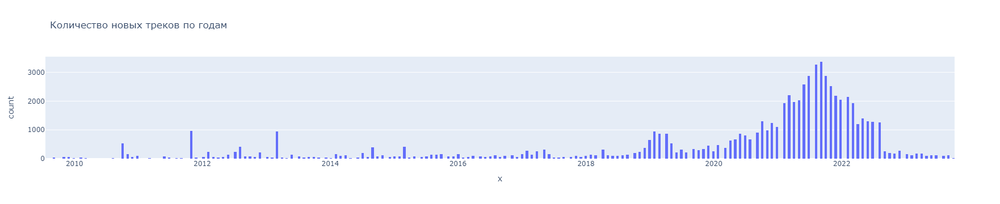

In [59]:
# Строим гистограмму
fig = px.histogram(meta['dttm'], 
                   x=meta['dttm'].apply(unix_ym), 
                   nbins=500,
                   title='Количество новых треков по годам')
# Отображаем график
fig.show()

Бум упоминаний треков приходится на октябрь-ноябрь 2021

Посмотрим по количеству копий трека

In [60]:
meta['title'].name

'title'

In [61]:
meta['title'].value_counts()

title
Morena                                                     81
Smooth Criminal                                            75
Rolê                                                       72
Wicked Game                                                67
Esquema Preferido                                          66
                                                           ..
Easy Love                                                   1
Snowpoint City (Day) (From “Pokemon Diamond And Pearl“)     1
BFG 10000 (From "Doom Eternal")                             1
It's a Good Day                                             1
17                                                          1
Name: count, Length: 45462, dtype: int64

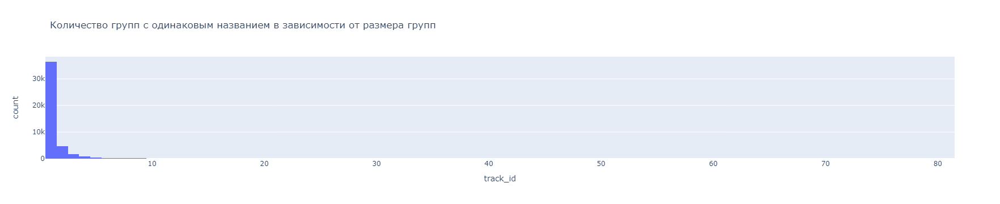

In [62]:
unique_title = meta.groupby('title')['track_id'].count().sort_values(ascending=False)
# Строим гистограмму
fig = px.histogram(unique_title, 
                   x=unique_title.name,
                   nbins=100,
                   title='Количество групп с одинаковым названием в зависимости от размера групп')
# Отображаем график
fig.show()

Большая часть треков имеют уникальное название.

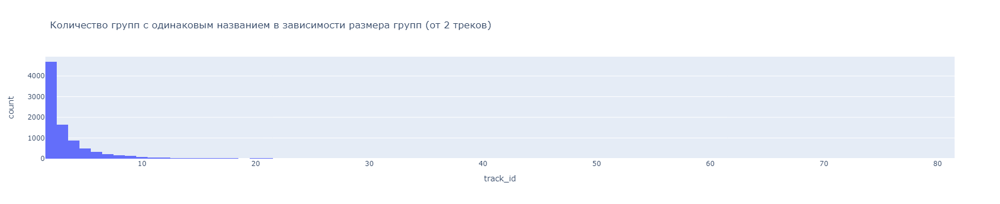

In [63]:
# Строим гистограмму
fig = px.histogram(unique_title[unique_title>1], 
                   x=unique_title[unique_title>1].name,
                   title='Количество групп с одинаковым названием в зависимости размера групп (от 2 треков)')

# Отображаем график
fig.show()

#### Извлечем год из столбца и создадим новый признак

In [64]:
meta.info()

<class 'pandas.core.frame.DataFrame'>
Index: 71768 entries, 0 to 71768
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   track_id      71768 non-null  object 
 1   dttm          71768 non-null  float64
 2   title         71768 non-null  object 
 3   language      22047 non-null  object 
 4   isrc          71768 non-null  object 
 5   genres        71768 non-null  object 
 6   duration      71768 non-null  float64
 7   title_cover   71768 non-null  int64  
 8   title_year    71768 non-null  object 
 9   len_title     71768 non-null  int64  
 10  count_genres  71768 non-null  int64  
dtypes: float64(2), int64(3), object(6)
memory usage: 6.6+ MB


In [65]:
meta['dttm_year'] = meta['dttm'].apply(lambda x: datetime.utcfromtimestamp(x/1000).strftime('%Y'))

### Обработка столбца 'isrc'

Структура кода ISRC XXCCCYYNNNNN:<br>
- XX - код страны<br>
- ССС - код эмитента. Используется совместно с кодом страны.<br>
- YY - год присвоения кода<br>
- NNNNN - индентификатор муз. композиции. Используется совместно с годом.


In [66]:
print('Пустых ISRC:', meta['isrc'].isna().sum())
print('Дубликатов ISRC:', meta['isrc'].dropna().duplicated().sum())
print('Некорректных ISRC:', - meta['isrc'].dropna().apply(correct_isrc).sum() + len(meta['isrc'].dropna()))

Пустых ISRC: 0
Дубликатов ISRC: 484
Некорректных ISRC: 314


Выведем некорректный ISRC. По возможности преобразуем.

In [67]:
meta[~meta['isrc'].apply(correct_isrc)]['isrc'].dropna()

2151     unknown
2185     unknown
2238     unknown
2317     unknown
3838     unknown
          ...   
71703    unknown
71704    unknown
71705    unknown
71706    unknown
71707    unknown
Name: isrc, Length: 314, dtype: object

In [68]:
meta['isrc'] = meta['isrc'].apply(lambda x: x.replace('-', '') if x else x)

Извлечем новые признаки

In [69]:
add_isrc_features(meta)
meta.sample(5)

,track_id,dttm,title,language,isrc,genres,duration,title_cover,title_year,len_title,count_genres,dttm_year,isrc_country_code,isrc_issuer,isrc_issuer_full,isrc_year
56201,b4b04a165dd329b8047425d995c706f7,1.601591e+12,Crying in the Rain,None,QZNJV2036920,[POP],174400.0,0,None,18,1,2020,QZ,NJV,QZNJV,2020
31004,f7a88a70d23bdd4a012565e0ca1c9826,1.629401e+12,Money Power Glory,None,QZNJV2139568,[POP],263850.0,0,None,17,1,2021,QZ,NJV,QZNJV,2021
25637,45339fee1024354c882e0b8be3501f5d,1.624568e+12,Marrom Bombom,PT,BR03D2101723,"[FOLK, LATINFOLK]",194950.0,0,None,13,2,2021,BR,03D,BR03D,2021
25801,16576a20c2596d81374ef02c074f10a5,1.624578e+12,Bring Me To Life,EN,USDPK2100060,"[METAL, METALCOREGENRE]",231730.0,0,None,16,2,2021,US,DPK,USDPK,2021
37165,cc10b6bc81688a106fa847535cb3a497,1.634512e+12,Cavaleiro Alado,None,QZNJX2164729,"[FOLK, LATINFOLK]",139530.0,0,None,15,2,2021,QZ,NJX,QZNJX,2021


Рассмотрим дубликаты.

In [70]:
meta.dropna(subset=['isrc']).sort_values(by='isrc').loc[meta['isrc'].duplicated(keep=False)]

,track_id,dttm,title,language,isrc,genres,duration,title_cover,title_year,len_title,count_genres,dttm_year,isrc_country_code,isrc_issuer,isrc_issuer_full,isrc_year
26955,8aff9d28865aaf1fa44e46b82cba0f63,1.625586e+12,Burma,None,ATAJ12100470,[FOLK],179300.0,0,None,5,1,2021,AT,AJ1,ATAJ1,2021
27012,be0233f57dbb59079929ac646b0b9d5c,1.625590e+12,Zivot da stane ne sme,None,ATAJ12100470,[FOLK],151190.0,0,None,21,1,2021,AT,AJ1,ATAJ1,2021
51052,196a0973d73122891a426f8334105ce7,1.553893e+12,Inní mér syngur vitleysingur,EN,ATN261668711,"[FOLKMETAL, METAL]",237010.0,0,None,28,2,2019,AT,N26,ATN26,2016
66395,425761c88ebc69e89c748eb537671953,1.524943e+12,Inni Mer Syngur Vitleysingur,EN,ATN261668711,"[FOLKMETAL, METAL]",237010.0,0,None,28,2,2018,AT,N26,ATN26,2016
66396,466df43223bcc7e5d0973e9038890fb7,1.524943e+12,Nattfodd,EN,ATN261668712,"[FOLKMETAL, METAL]",255380.0,0,None,8,2,2018,AT,N26,ATN26,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2317,fb97e639240fb249756b40e0f88387cb,1.640334e+12,Глава 12. Пятно,NaN,unknown,[FAIRYTALES],103280.0,0,None,15,1,2021,unknown,unknown,unknown,unknown
16767,395190e98e079bfefb670f28d89a4f51,1.572278e+12,Oydin kechalar,NaN,unknown,"[POP, UZBEKPOP]",176950.0,0,None,14,2,2019,unknown,unknown,unknown,unknown
43049,f42df63cb6627c6efa3cef11ebb4e670,1.421413e+12,Новый год,NaN,unknown,[INDIE],303840.0,0,None,9,1,2015,unknown,unknown,unknown,unknown
16778,d7b187759005fb8134c927881fa44a83,1.572359e+12,Wicked Game,NaN,unknown,"[ELECTRONICS, TRANCE]",278510.0,0,None,11,2,2019,unknown,unknown,unknown,unknown


В данном случае нескольким track_id принадлежит один isrc. Это могло получиться в том случае, когда трек выпускался в нескольких альбомах.<br>
Воспользуемся данной ситуацией для заполнения пропусков.

In [71]:
meta.dropna(subset=['isrc']).sort_values(by='isrc').loc[meta['isrc'].duplicated(keep=False)].isna().sum()

track_id               0
dttm                   0
title                  0
language             429
isrc                   0
genres                 0
duration               0
title_cover            0
title_year             0
len_title              0
count_genres           0
dttm_year              0
isrc_country_code      0
isrc_issuer            0
isrc_issuer_full       0
isrc_year              0
dtype: int64

In [72]:
# заполнение самыми высокочастотными внутрегрупповыми (ISRC) значениями
meta['language'] = meta.groupby("isrc")['language'] \
                       .transform(lambda x: x.fillna(x.value_counts().index[0]) if x.value_counts().shape[0] != 0 else x)

In [73]:
meta.dropna(subset=['isrc']).loc[meta['isrc'].duplicated(keep=False)]['language'].isna().sum()

429

In [74]:
meta.columns

Index(['track_id', 'dttm', 'title', 'language', 'isrc', 'genres', 'duration',
       'title_cover', 'title_year', 'len_title', 'count_genres', 'dttm_year',
       'isrc_country_code', 'isrc_issuer', 'isrc_issuer_full', 'isrc_year'],
      dtype='object')

In [75]:
#Заполним пропуски значением 'unknown'.
meta['isrc'].fillna('unknown', inplace=True)

In [76]:
meta['dttm'].shape

(71768,)

In [77]:
meta['dttm_year'].sort_values()

44720    2009
44646    2009
44647    2009
44648    2009
44649    2009
         ... 
40357    2023
40356    2023
40355    2023
40363    2023
6496     2023
Name: dttm_year, Length: 71768, dtype: object

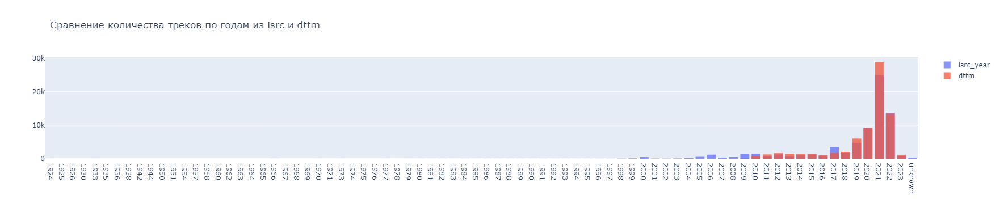

In [78]:
# Создаем гистограммы для каждого столбца дат
trace1 = go.Histogram(x=meta['isrc_year'].sort_values(), opacity=0.75, name='isrc_year')
trace2 = go.Histogram(x=meta['dttm_year'], opacity=0.75, name='dttm')

# Добавляем гистограммы на график
data = [trace1, trace2]

# Создаем макет
layout = go.Layout(barmode='overlay', title_text='Сравнение количества треков по годам из isrc и dttm')

# Создаем фигуру и отображаем график
fig = go.Figure(data=data, layout=layout)
fig.show()

In [79]:
# затычка
#meta[meta['isrc_year'] == 'unknown'] = 2023
#meta['isrc_year'] = pd.to_datetime(meta['isrc_year'] + '-01-01', format='%Y-%m-%d')
#meta['isrc_year'] = meta['isrc_year'].dt.year


In [80]:
ls = sorted(meta['isrc_year'].unique())
print('Наиболее старые треки:',ls[0])
print('Наиболее новые треки:',ls[-2])

Наиболее старые треки: 1924
Наиболее новые треки: 2023


## Вывод по EDA

**Covers:**
- соотношение треков оригинал/кавер -  6%/94%
- пропуски только в `original_track_id`, их там большая часть 66776 на 71597 строк

**lyrics:**
- во всех столбцах есть повторы.
- пропусков нет
- медианная длина текста находится в  1165 символах, существую аномалии с слишком коротким или большими текстами
  
**meta:**
- пропуски пресутсвуют в языках и isrc, причем в языке большая часть
- Топ 10 жанров :`'FOLK', 'LATINFOLK', 'POP', 'ALLROCK', 'ROCK', 'ALTERNATIVE','ELECTRONICS', 'SOUNDTRACK', 'RAP', 'DANCE'`
- Наиболее популярные языки: Английский, Испанский, Русский
- Время самое ранние упоминания из столбца `ddtm` 08.2009 последнее 2023-10, бум упоминаний треков приходится на октябрь-ноябрь 2021
- Большая часть данных судя по всему не имеет каверов, треки с первым и единственным упоминанием доминируют в данных, если не брать во внимание случаи одинаковых названий
- Для столбца `isrc` извлекли признаки, проверили на корректность, существуют трек для которых  один isrc для разных track_id, возможно из-за того что один трек в разные альбомы
- Дата из `isrc` не всегда совпадает с датой в `ddtm`, есть аномалии с данными больше чем 23 год и их нельзя найти в базе

# Слияние по track_id. Создание финального датасета

In [81]:
covers.shape, lyrics.shape, meta.shape, track_genres.shape

((71597, 3), (10277, 5), (71768, 16), (71768, 129))

In [82]:
covers.info(), lyrics.info(), meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71597 entries, 0 to 71596
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   original_track_id  4821 non-null   object
 1   track_id           71597 non-null  object
 2   track_remake_type  71597 non-null  object
dtypes: object(3)
memory usage: 1.6+ MB
<class 'pandas.core.frame.DataFrame'>
Index: 10277 entries, 771 to 10785
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   lyricId          10277 non-null  object
 1   text             10277 non-null  object
 2   track_id         10277 non-null  object
 3   len_text         10277 non-null  int64 
 4   count_rows_text  10277 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 481.7+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 71768 entries, 0 to 71768
Data columns (total 16 columns):
 #   Column             Non-Null Count  D

(None, None, None)

In [83]:
df = covers.set_index('track_id').join(meta.set_index('track_id').drop('genres', axis=1), how='outer') \
                                 .join(lyrics.set_index('track_id').drop('lyricId', axis=1), how='outer') \
                                 .join(track_genres)

df['dttm_year'] = df['dttm_year'].fillna('unknown').astype('category')
df['language'] = df['language'].fillna('unknown').astype('category')

# Классификация: кавер и оригинал.

## Поиск зависимостей между признаками и целевой переменной.

Построим матрицу корреляции без заголовков, идентификаторов и признаков-жанров.

=== Время выполнения: 79 seconds ===


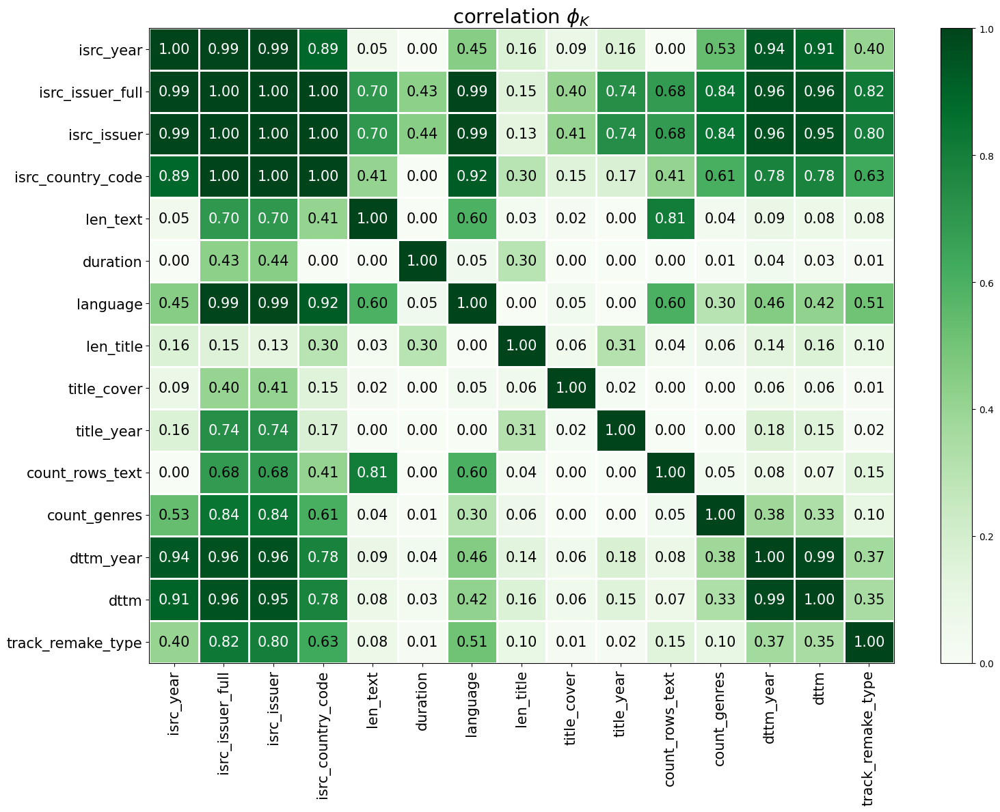

In [84]:
start_time = time.time()
data_corr = \
    (df[['track_remake_type',
         'dttm',
         'dttm_year',        
         'count_genres',
         'count_rows_text',
         'title_year',
         'title_cover',
         'len_title',
         'language',
         'duration',
         'len_text',
         'isrc_country_code',
         'isrc_issuer',
         'isrc_issuer_full',
         'isrc_year']].phik_matrix(interval_cols=['dttm',
                                                  'duration',
                                                  'len_title',
                                                  'len_text',
                                                  'count_genres',
                                                  'count_rows_text']))
#warnings.filterwarnings('default')

plot_correlation_matrix(data_corr.values,
                        x_labels=data_corr.columns,
                        y_labels=data_corr.index,
                        vmin=0, vmax=1, color_map="Greens",
                        title=r"correlation $\phi_K$",
                        fontsize_factor=1.5,
                        figsize=(16, 12))
print("=== Время выполнения: %s seconds ===" % int(time.time() - start_time))


<u>Вывод:</u><br>
Как видим есть сильная связь между целевой переменной и признаками: ид. эмитента (сокращенной и поолный), код страны, язык, год выпуска).<br>
Присутствует мультиколлинеарность между признаками, сгенерированными из isrc, языком и годом из dttm.<br>
Более корректно эмитента указывать с кодом страны, поэтому признак isrc_issuer будет отброшен.

## Обучение модели определения оригинала трека.

Отберём строки с известными значениями original/cover и поделим на тренировочную и тестовую выборку.<br>
Также отбросим столбец с текстом, названиями песен, известных оригиналах.

In [103]:
df_new = df[~df['track_remake_type'].isna()].drop('text', axis=1)
df_new.shape

(71597, 147)

In [104]:
f_cols = list(set(df_new.columns) - set(['original_track_id', 'track_remake_type']) - set(['title', 'isrc_issuer']))

target = df_new['track_remake_type'].apply(lambda x: 1 if x == 'ORIGINAL' else 0)
features = df_new[f_cols]

features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.15, random_state=STATE, stratify=target)

cat_features = list(set(features.columns) - set(['dttm','duration','len_text', 'len_title','count_genres', 'count_rows_text']))

В качестве модели машинного обучения, воспользуемся CatBoost, который отлично обрабатывает категориальные признаки и не требует предварительного избавления от мультиколлинеарности.

In [105]:
start_time = time.time()
model = CatBoostClassifier(cat_features=cat_features,
                           iterations=400,
                           learning_rate=0.1,
                           depth=7,
                           random_state=STATE,
                           auto_class_weights='Balanced',
                           verbose=False)
model.fit(features_train, target_train)
predictions = model.predict(features_test)

# AUC-ROC на тестовом наборе
roc_auc = roc_auc_score(target_test, model.predict_proba(features_test)[:, 1])
print("AUC-ROC Score на тестовых данных:", roc_auc)
print("=== Время обучения модели: %s seconds ===" % int(time.time() - start_time))


AUC-ROC Score на тестовых данных: 0.9915000775167091
=== Время обучения модели: 121 seconds ===


Text(0.5, 1.0, 'Топ15 важных признаков')

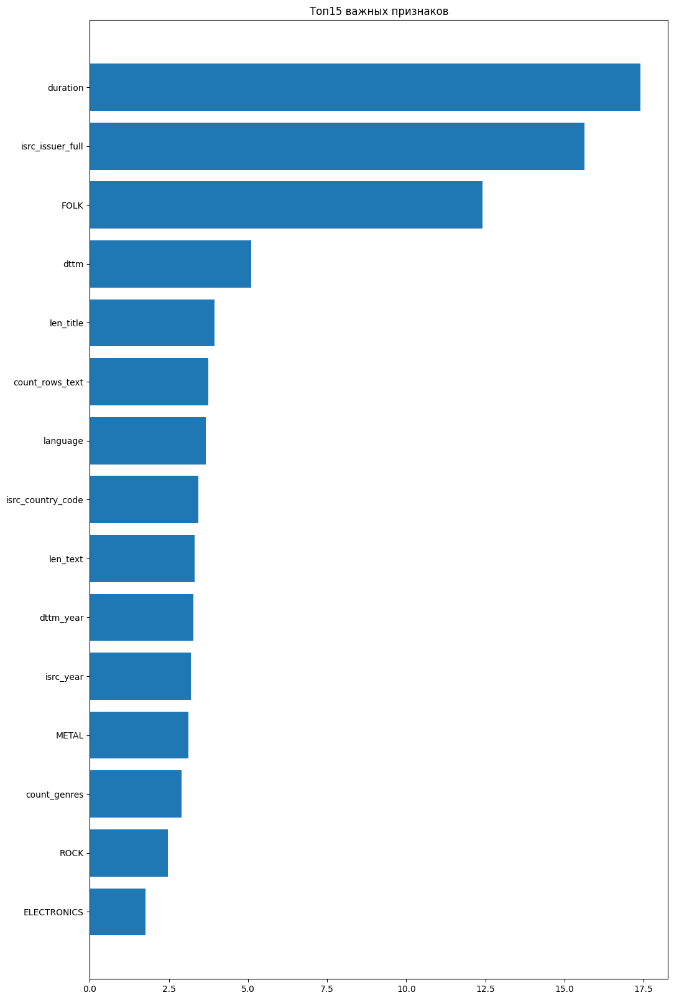

In [106]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 20))
plt.barh(range(len(sorted_idx[-15:])), feature_importance[sorted_idx[-15:]], align='center')
plt.yticks(range(len(sorted_idx[-15:])), np.array(features_test.columns)[sorted_idx[-15:]])
plt.title('Топ15 важных признаков')


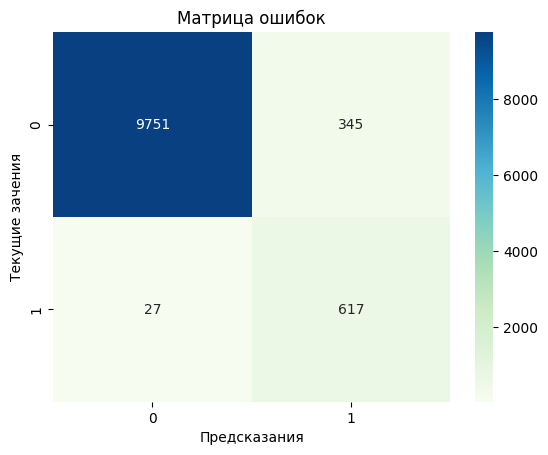

In [107]:
cm = confusion_matrix(target_test, predictions)
sns.heatmap(cm,
            annot=True,
            fmt='.0f',
            cmap='GnBu')
plt.title('Матрица ошибок')
plt.xlabel('Предсказания')
plt.ylabel('Текущие зачения');

## Отбор самых важных признаков через feature_importance

Отбросим неважные признаки с 0 значением важности и обучим новую модель.

In [108]:
fi_result = pd.DataFrame(feature_importance[sorted_idx], 
                         index=np.array(features_test.columns)[sorted_idx]).sort_values(by=0, ascending=False)
fs = fi_result[fi_result[0] > 0].index
len(fi_result), len(fs)

(143, 106)

In [109]:
cat_features = list(set(features[fs].columns) - set(['dttm','duration','len_text', 'len_title','count_genres', 'count_rows_text']))
features_train_fs = features_train[fs]
features_test_fs = features_test[fs]

In [110]:
start_time = time.time()
model_1 = CatBoostClassifier(cat_features=cat_features,
                           iterations=400,
                           learning_rate=0.1,
                           depth=7,
                           random_state=STATE,
                           auto_class_weights='Balanced',
                           verbose=False)
model_1.fit(features_train_fs, target_train)
predictions = model_1.predict(features_test_fs)

# Вычислите AUC-ROC на тестовом наборе
roc_auc = roc_auc_score(target_test, model_1.predict_proba(features_test_fs)[:, 1])
print("AUC-ROC Score на тестовых данных:", roc_auc)
print("=== Время обучения модели: %s seconds ===" % int(time.time() - start_time))


AUC-ROC Score на тестовых данных: 0.9918084525204005
=== Время обучения модели: 184 seconds ===


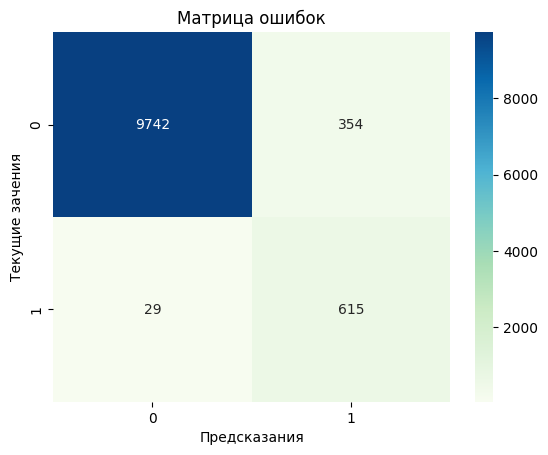

In [111]:
cm = confusion_matrix(target_test, predictions)
sns.heatmap(cm,
            annot=True,
            fmt='.0f',
            cmap='GnBu')
plt.title('Матрица ошибок')
plt.xlabel('Предсказания')
plt.ylabel('Текущие зачения');

## Оценка важности признаков с учётом попадания в класс

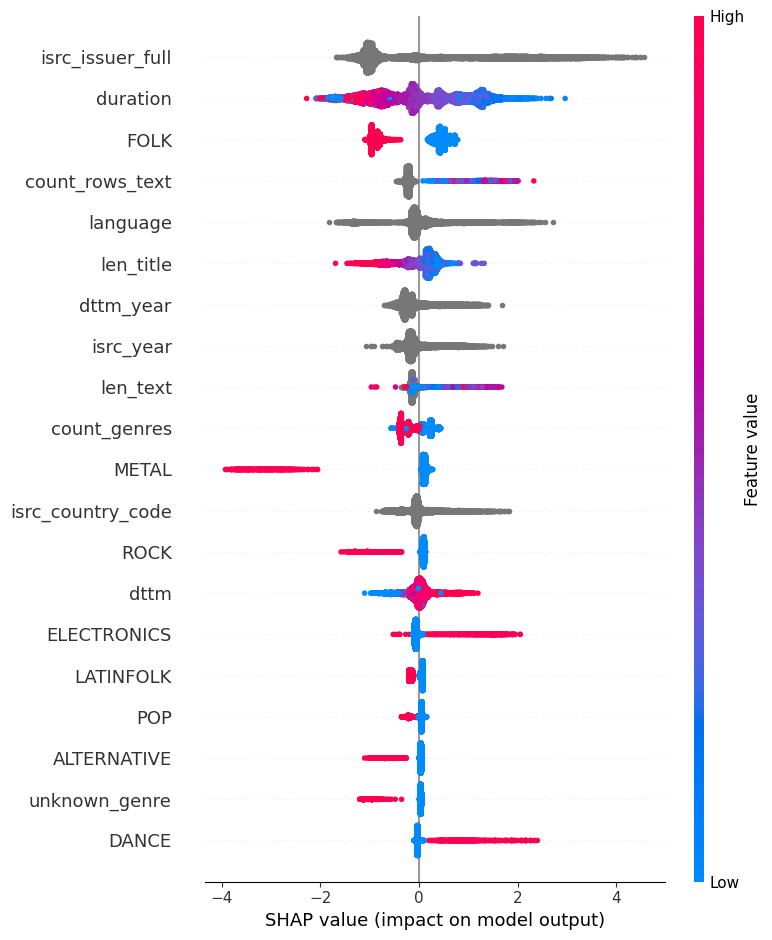

In [112]:
# Создание объекта Tree Explainer для модели
explainer = shap.TreeExplainer(model)

# Расчет SHAP значений
shap_values = explainer.shap_values(features_test)

# Визуализация SHAP значений
shap.summary_plot(shap_values, features_test, feature_names=features_test.columns)

## ВЫВОД по классификации:

Для музыкальных треков из имеющихся данных были созданы 137 новых признаков (129 признаков-жанров), обучена модель на 85% данных с известными значениями столбца 'track_remake_type' и протестирована на оставшихся. Для данной модели не использовалось содержание заголовков и текста песен, а лишь их размер, а также извлекалась возможная полезная информация из заголовков (год и упоминание "cover").<br>
При подборе гиперпараметров модели была поставлена задача добиться максимально качественного поиска оригинала (минимизация ошибки 1-го рода). Также была проведен отбор признаков используя feature_importance и обучена новая модель. До отбора признаков модель совершала меньше ошибок. Метрика качества выбрана AUC-ROC = 0.992 на тестовой выборке. Проведена оценка важности признаков с учётом "попадания в класс". Самыми важными оказались эмитент и длительность трека.<br>
Данная модель корректно работает при условии, что сушествует лишь 2 класса (оригинал и кавер).<br>

# BERT multy language embeded

In [ ]:
sbert = SentenceTransformer('all-MiniLM-L6-v2')

In [ ]:
text = list(lyrics['text'])
embed_text = sbert.encode(text,convert_to_tensor=True)
embed_text

https://www.sbert.net/docs/quickstart.html

## fast_clustering

https://github.com/UKPLab/sentence-transformers/blob/master/examples/applications/clustering/fast_clustering.py

In [ ]:
print("Start clustering")
start_time = time.time()

#Two parameters to tune:
#min_cluster_size: Only consider cluster that have at least 25 elements
#threshold: Consider sentence pairs with a cosine-similarity larger than threshold as similar
clusters = util.community_detection(embed_text, min_community_size=25, threshold=0.75)

print("Clustering done after {:.2f} sec".format(time.time() - start_time))

In [ ]:
#Print for all clusters the top 3 and bottom 3 elements
for i, cluster in enumerate(clusters):
    print("\nCluster {}, #{} Elements ".format(i+1, len(cluster)))
    for sentence_id in cluster[0:3]:
        print("\t", text[sentence_id])
    print("\t", "...")
    for sentence_id in cluster[-3:]:
        print("\t", text[sentence_id])

In [ ]:
#Compute cosine-similarities
cosine_scores = util.cos_sim(embed_text, embed_text)
cosine_scores

### AgglomerativeClustering

In [ ]:
type(embed_text)

In [ ]:
# Normalize the embeddings to unit length
normalized_embeddings = F.normalize(embed_text, p=2, dim=1)

In [ ]:
normalized_embeddings_np = normalized_embeddings.cpu().numpy()

In [ ]:
# Perform kmean clustering
clustering_model = AgglomerativeClustering(n_clusters=None, distance_threshold=1.5) #, affinity='cosine', linkage='average', distance_threshold=0.4)
clustering_model.fit(normalized_embeddings_np)
cluster_assignment = clustering_model.labels_
cluster_assignment

In [ ]:
lyrics['cluster_assignment'] = cluster_assignment

In [ ]:
lyrics.isna().sum()

### diameter-clustering

https://github.com/antklen/diameter-clustering

In [ ]:
embed_text.cpu().numpy().shape

In [ ]:
cosine_scores.cpu().numpy()

In [ ]:
model = LeaderClustering(max_radius=0.15, metric='cosine')
labels_leader = model.fit_predict(embed_text.cpu().numpy())
lyrics['leader'] = labels_leader

# Описание решения

Предполагается, что решение будет продствлять двустадийную модель и осущетвелно следующим алгоритмом:  
    1) В базу всех треков делается запрос "Найти похожее по тексту"  к конкретному треку  
    2) С помощью кластеризации выбираются самые похожие  
    3) Накладывается необходимый фильтр на отобранные треки  

Пункт 3 может являться достаточно расплывчатым и может включать в себя много дополнительных параметров необходимых заказчику. Например:  
    1) Отбор песен по жанрам  
    2) Вывод только оригиналов  
    3) Вывод только каверов  
    4) Вывод самых близких песен по тексту, в том числе и не каверы  

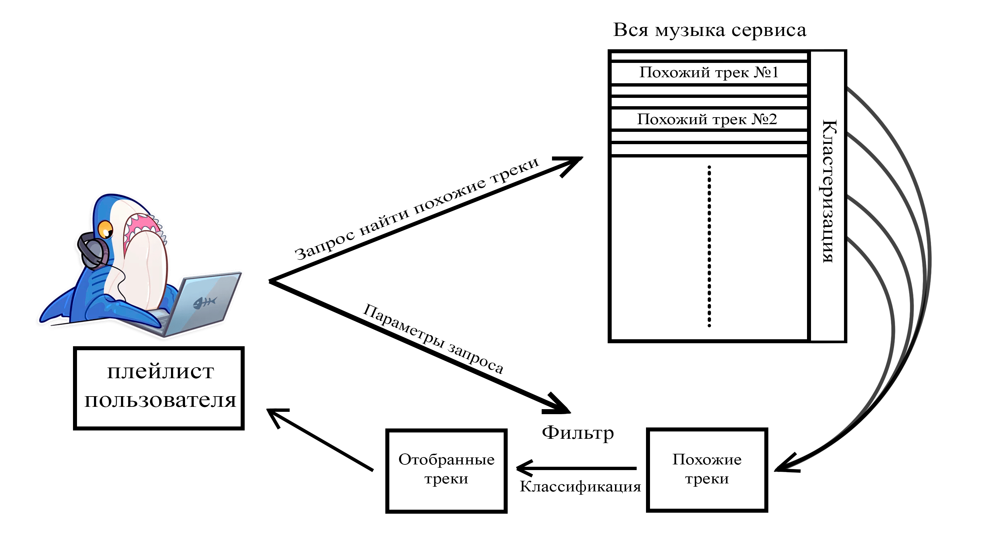

Работа с большим количеством данных в  накладывает на алгоритм серьезные рамки времени работы и поиска. Для пользователя всё должно быть практически мгновенно. Поэтому необходимо подобрать подход с самым хороши соотношеним точности ко времени выполнения.

# Кластеризация

В данном разделе будут исследованы подходы для векторизации, кластеризации и поиска ближайших соседей. Будут исследован следующий стек:  
    1)CountVectorizer  
    2)TfidfVectorizer  
    3)PCA  
    3)NearestNeighbors  
    4)Faiss  

Здесь выжным вопросом будет, правильно ли это оценивается. Все ответы для кластеризации достоверно есть в
базе данных. Из-за этого метрика будет очень высокой. С другой стороны можно убрать проверку наличия ответа в базе,
это ухудшит метрику но больше приблизит к реальной ситуации.

Было решено, что на этом этапе первостепенной задачей является построение модели для кластеризации, поэтому проверку
наличия ответа для тренировочного датасета я оставил.

Проверка будет работать следующим образом. У нас есть достоверно известная связки COVER <--> ORIGINAL.
После нахождения похожих треков, мы будем проверять попала ли его связка в полученную группу. Метрика будет accuracy@n.

In [ ]:
data = upload_data()
test, answer = create_test_data(data)

In [ ]:
test['track_remake_type'].value_counts()

In [ ]:
len(test['track_id'].unique())

## Векторизация текстов

In [ ]:
data['text'] = data['text'].str.replace('\n', ' ')
test['text'] = test['text'].str.replace('\n', ' ')
data['text'] = data['text'].str.lower()
test['text'] = test['text'].str.lower()
data['title'] = data['title'].str.lower()
test['title'] = test['title'].str.lower()

### CountVectorizer + NearestNeighbors

In [ ]:
vect = CountVectorizer()
minmax_scale = MinMaxScaler() #Необходимо отмасштабировать данные
vect_base_cv = vect.fit_transform(data['text']).toarray()
vect_base_cv = minmax_scale.fit_transform(vect_base_cv)

test_cv = vect.transform(test['text']).toarray()
test_cv = minmax_scale.transform(test_cv)

In [ ]:
for i in [5, 25, 50]:
    nn = NearestNeighbors(n_neighbors=i, metric = 'euclidean')
    nn.fit(vect_base_cv)
    start_time = time.time()
    dist, ind = nn.kneighbors(test_cv)
    print(f"Время работы модели NearestNeighbors для тестовых данных = {round(time.time() - start_time, 5)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, ind, answer, return_res=True)}%")
    print()

### Проверка метрики на адекватность

In [ ]:
#Проверка, кинем смоделированные индексы
accuracy_at_n(test, data, [[i, i+1,i, i+3, i] for i in range(len(test['track_id'].tolist()))], answer)

In [ ]:
#Проверка, кинем неверные ответы
fake_answer = {k:a for k, a in zip(list(answer.keys()),
                                   data['track_id'].sample(len(list(answer.keys()))).tolist())}
accuracy_at_n(test, data, ind, fake_answer)

### CountVectorizer + PCA + NearestNeighbors

In [ ]:
pca = PCA(n_components=1024)

vect_base_cv = vect.fit_transform(data['text']).toarray()
vect_base_cv = minmax_scale.fit_transform(vect_base_cv)
vect_base_cv_pca = pca.fit_transform(vect_base_cv)

In [ ]:
test_cv = vect.transform(test['text']).toarray()
test_cv = minmax_scale.transform(test_cv)
test_cv_pca = pca.transform(test_cv)

In [ ]:
for i in [5, 25, 50]:
    nn = NearestNeighbors(n_neighbors=i, metric = 'euclidean')
    nn.fit(vect_base_cv_pca)
    start_time = time.time()
    dist, ind = nn.kneighbors(test_cv_pca)
    print(f"Время работы модели NearestNeighbors для тестовых данных = {round(time.time() - start_time, 5)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, ind, answer, return_res=True)}%")
    print()

### TfidfVectorizer + NearestNeighbors

In [ ]:
tfidf = TfidfVectorizer()
vect_base_tfidf = tfidf.fit_transform(data['text']).toarray()
test_tfidf = tfidf.transform(test['text']).toarray()

In [ ]:
for i in [5, 25, 50]:
    nn = NearestNeighbors(n_neighbors=i, metric = 'euclidean')
    nn.fit(vect_base_tfidf)
    start_time = time.time()
    dist, ind = nn.kneighbors(test_tfidf)
    print(f"Время работы модели NearestNeighbors для тестовых данных = {round(time.time() - start_time, 5)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, ind, answer, return_res=True)}%")
    print()

### TfidfVectorizer + PCA + NearestNeighbors

#### Размерность 512

In [ ]:
#Переменные vect_base_tfidf и test_tfidf из пункта 2.3
pca_512 = PCA(n_components=512)
start_time = time.time()
vect_base_tfidf_pca_512 = pca_512.fit_transform(vect_base_tfidf)
print(f"Время работы PCA 512 для базы данных = {round(time.time() - start_time, 5)} секунд")

start_time = time.time()
test_tfidf_pca_512 = pca_512.transform(test_tfidf)
print(f"Время работы PCA для test = {round(time.time() - start_time, 5)} секунд")

In [ ]:
for i in [5, 25, 50]:
    nn = NearestNeighbors(n_neighbors=i, metric = 'euclidean')
    nn.fit(vect_base_tfidf_pca_512)

    start_time = time.time()
    dist, ind = nn.kneighbors(test_tfidf_pca_512)
    print(f"Время поиска {i} соседей методом NearestNeighbors = {round(time.time() - start_time, 5)} секунд")

    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, ind, answer, return_res=True)}%")
    print()

#### Размерность 1024

In [ ]:
#Переменные vect_base_tfidf и test_tfidf из пункта 2.3
pca_1024 = PCA(n_components=1024)
start_time = time.time()
vect_base_tfidf_pca_1024 = pca_1024.fit_transform(vect_base_tfidf)
print(f"Время работы PCA 1024 для базы данных = {round(time.time() - start_time, 5)} секунд")

start_time = time.time()
test_tfidf_pca_1024 = pca_1024.transform(test_tfidf)
print(f"Время работы PCA для test = {round(time.time() - start_time, 5)} секунд")

In [ ]:
for i in [5, 25, 50]:
    nn = NearestNeighbors(n_neighbors=i, metric = 'euclidean')
    nn.fit(vect_base_tfidf_pca_1024)

    start_time = time.time()
    dist, ind = nn.kneighbors(test_tfidf_pca_1024)
    print(f"Время поиска {i} соседей методом NearestNeighbors = {round(time.time() - start_time, 5)} секунд")

    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, ind, answer, return_res=True)}%")
    print()

#### Размерность 2048

In [ ]:
#Переменные vect_base_tfidf и test_tfidf из пункта 2.3
pca_2048 = PCA(n_components=2048)
start_time = time.time()
vect_base_tfidf_pca_2048 = pca_2048.fit_transform(vect_base_tfidf)
print(f"Время работы PCA 2048 для базы данных = {round(time.time() - start_time, 5)} секунд")

start_time = time.time()
test_tfidf_pca_2048 = pca_2048.transform(test_tfidf)
print(f"Время работы PCA для test = {round(time.time() - start_time, 5)} секунд")

In [ ]:
for i in [5, 25, 50]:
    nn = NearestNeighbors(n_neighbors=i, metric = 'euclidean')
    nn.fit(vect_base_tfidf_pca_2048)

    start_time = time.time()
    dist, ind = nn.kneighbors(test_tfidf_pca_2048)
    print(f"Время поиска {i} соседей методом NearestNeighbors = {round(time.time() - start_time, 5)} секунд")

    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, ind, answer, return_res=True)}%")
    print()

### Faiss

#### Индекс IVFPQ

In [ ]:
#Создаём IVFPQ индекс
#Размерность
dims = vect_base_tfidf.shape[1]
#Делитель
quantizer = faiss.IndexFlatL2(dims)
#Создаём индексы
idx_IVFPQ = faiss.IndexIVFPQ(quantizer, dims, 1000, 1, 6)
#Количество соседних ячеек, куда заходит алгоритм поиска
idx_IVFPQ.nprobe = 50

In [ ]:
#Тренируем модель
idx_IVFPQ.train(np.ascontiguousarray(vect_base_tfidf).astype('float32'))
idx_IVFPQ.add(np.ascontiguousarray(vect_base_tfidf).astype('float32'))

In [ ]:
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IVFPQ.search(np.ascontiguousarray(test_tfidf).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IVFPQ = {round(time.time() - start_time, 5)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

#### Индекс IVFPQ + PCA(512)

In [ ]:
#Создаём IVFPQ индекс
#Размерность
dims = vect_base_tfidf_pca_512.shape[1]
#Делитель
quantizer = faiss.IndexFlatL2(dims)
#Создаём индексы
idx_IVFPQ = faiss.IndexIVFPQ(quantizer, dims, 1000, 2, 6)
#Количество соседних ячеек, куда заходит алгоритм поиска
idx_IVFPQ.nprobe = 50

In [ ]:
#Тренируем модель
start_time = time.time()
idx_IVFPQ.train(np.ascontiguousarray(vect_base_tfidf_pca_512).astype('float32'))
idx_IVFPQ.add(np.ascontiguousarray(vect_base_tfidf_pca_512).astype('float32'))
print(f"Время рассчета индексов для IVFPQ с PCA(512) = {round(time.time() - start_time, 6)} секунд")

In [ ]:
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IVFPQ.search(np.ascontiguousarray(test_tfidf_pca_512).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IVFPQ = {round(time.time() - start_time, 6)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

#### Индекс IVFPQ + PCA(1024)

In [ ]:
#Создаём IVFPQ индекс
#Размерность
dims = vect_base_tfidf_pca_1024.shape[1]
#Делитель
quantizer = faiss.IndexFlatL2(dims)
#Создаём индексы
idx_IVFPQ = faiss.IndexIVFPQ(quantizer, dims, 1000, 2, 6)
#Количество соседних ячеек, куда заходит алгоритм поиска
idx_IVFPQ.nprobe = 50

In [ ]:
#Тренируем модель
start_time = time.time()
idx_IVFPQ.train(np.ascontiguousarray(vect_base_tfidf_pca_1024).astype('float32'))
idx_IVFPQ.add(np.ascontiguousarray(vect_base_tfidf_pca_1024).astype('float32'))
print(f"Время рассчета индексов для IVFPQ с PCA(1024) = {round(time.time() - start_time, 6)} секунд")

In [ ]:
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IVFPQ.search(np.ascontiguousarray(test_tfidf_pca_1024).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IVFPQ = {round(time.time() - start_time, 6)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

#### Индекс IVFPQ + PCA(2048)

In [ ]:
#Создаём IVFPQ индекс
#Размерность
dims = vect_base_tfidf_pca_2048.shape[1]
#Делитель
quantizer = faiss.IndexFlatL2(dims)
#Создаём индексы
idx_IVFPQ = faiss.IndexIVFPQ(quantizer, dims, 1000, 2, 6)
#Количество соседних ячеек, куда заходит алгоритм поиска
idx_IVFPQ.nprobe = 50

In [ ]:
#Тренируем модель
start_time = time.time()
idx_IVFPQ.train(np.ascontiguousarray(vect_base_tfidf_pca_2048).astype('float32'))
idx_IVFPQ.add(np.ascontiguousarray(vect_base_tfidf_pca_2048).astype('float32'))
print(f"Время рассчета индексов для IVFPQ с PCA(1024) = {round(time.time() - start_time, 6)} секунд")

In [ ]:
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IVFPQ.search(np.ascontiguousarray(test_tfidf_pca_2048).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IVFPQ = {round(time.time() - start_time, 6)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

#### IndexIVFFlat

In [ ]:
dims = vect_base_tfidf.shape[1]
quantizer = faiss.IndexFlatL2(dims)
idx_IVFFlat = faiss.IndexIVFFlat(quantizer, dims, 1000, faiss.METRIC_L2) #METRIC_L2
idx_IVFFlat.nprobe = 50

In [ ]:
#Тренируем модель
idx_IVFFlat.train(np.ascontiguousarray(vect_base_tfidf).astype('float32'))
idx_IVFFlat.add(np.ascontiguousarray(vect_base_tfidf).astype('float32'))

In [ ]:
#Ищем ответы для теста
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IVFFlat.search(np.ascontiguousarray(test_tfidf).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IVFFlat = {round(time.time() - start_time, 6)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

####  IndexIVFFlat + PCA(2048)

In [ ]:
dims = vect_base_tfidf_pca_2048.shape[1]
quantizer = faiss.IndexFlatL2(dims)
idx_IVFFlat = faiss.IndexIVFFlat(quantizer, dims, 1000, faiss.METRIC_L2) #METRIC_L2
idx_IVFFlat.nprobe = 50

In [ ]:
#Тренируем модель
idx_IVFFlat.train(np.ascontiguousarray(vect_base_tfidf_pca_2048).astype('float32'))
idx_IVFFlat.add(np.ascontiguousarray(vect_base_tfidf_pca_2048).astype('float32'))

In [ ]:
#Ищем ответы для теста
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IVFFlat.search(np.ascontiguousarray(test_tfidf_pca_2048).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IVFFlat = {round(time.time() - start_time, 6)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

####  IndexIMIFlat + PCA(512)

In [ ]:
dims = vect_base_tfidf_pca_512.shape[1]

M_mi = 2
nbits_mi = 6
ncentroids_mi = 2 ** (M_mi * nbits_mi)
coarse_quantizer_mi = faiss.MultiIndexQuantizer(dims, M_mi, nbits_mi)


idx_IMIFlat = faiss.IndexIVFFlat(coarse_quantizer_mi, dims, ncentroids_mi, faiss.METRIC_L2) #METRIC_L2
idx_IMIFlat.nprobe = 200
idx_IMIFlat.quantizer_trains_alone = True

In [ ]:
#Тренируем модель
idx_IMIFlat.train(np.ascontiguousarray(vect_base_tfidf_pca_512).astype('float32'))
idx_IMIFlat.add(np.ascontiguousarray(vect_base_tfidf_pca_512).astype('float32'))

In [ ]:
#Ищем ответы для теста
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IMIFlat.search(np.ascontiguousarray(test_tfidf_pca_512).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IVFFlat = {round(time.time() - start_time, 6)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

####  IndexIMIFlat + PCA(2048)

In [ ]:
dims = vect_base_tfidf_pca_2048.shape[1]

M_mi = 2
nbits_mi = 6
ncentroids_mi = 2 ** (M_mi * nbits_mi)
coarse_quantizer_mi = faiss.MultiIndexQuantizer(dims, M_mi, nbits_mi)


idx_IMIFlat = faiss.IndexIVFFlat(coarse_quantizer_mi, dims, ncentroids_mi, faiss.METRIC_L2) #METRIC_L2
idx_IMIFlat.nprobe = 1000
idx_IMIFlat.quantizer_trains_alone = True

In [ ]:
#Тренируем модель
idx_IMIFlat.train(np.ascontiguousarray(vect_base_tfidf_pca_2048).astype('float32'))
idx_IMIFlat.add(np.ascontiguousarray(vect_base_tfidf_pca_2048).astype('float32'))

In [ ]:
#Ищем ответы для теста
for i in [5, 25, 50]:
    start_time = time.time()
    vecs, idx = idx_IMIFlat.search(np.ascontiguousarray(test_tfidf_pca_2048).astype('float32'), i)
    print(f"Время поиска {i} соседей Faiss c индексом IMIFlat = {round(time.time() - start_time, 6)} секунд")
    print(f"Точность на тестовой выборке при {i} соседях = {accuracy_at_n(test, data, idx, answer, return_res=True)}%")
    print()

#### Результаты

<table>
    <tr>
        <td>Модель</td>
        <td>accuracy@5</td>
        <td>accuracy@25</td>
        <td>accuracy@50</td>
        <td>Время (n=5)</td>
        <td>Время (n=25)</td>
        <td>Время (n=50) </td>
    </tr>
    <tr>
        <td>CountVectorizer + NearestNeighbors</td>
        <td>46,078</td>
        <td>85,621</td>
        <td>90,85</td>
        <td>62,369</td>
        <td>61,886</td>
        <td>62,99899 </td>
    </tr>
    <tr>
        <td>CountVectorizer + PCA(1024) + NearestNeighbors</td>
        <td>41,83</td>
        <td>88,562</td>
        <td>92,81</td>
        <td>0,223</td>
        <td>0,225</td>
        <td>0,208 </td>
    </tr>
    <tr>
        <td>TfidfVectorizer + NearestNeighbors</td>
        <td>46,405</td>
        <td>91,503</td>
        <td>98,693</td>
        <td>62,05017</td>
        <td>63,7106</td>
        <td>62,01344 </td>
    </tr>
    <tr>
        <td>TfidfVectorizer + PCA(512) + NearestNeighbors</td>
        <td>46,732</td>
        <td>85,948</td>
        <td>92,484</td>
        <td>0,223</td>
        <td>0,225</td>
        <td>0,208 </td>
    </tr>
    <tr>
        <td>TfidfVectorizer + PCA(1024) + NearestNeighbors</td>
        <td>46,078</td>
        <td>85,621</td>
        <td>92,157</td>
        <td>0,44</td>
        <td>0,422</td>
        <td>0,44 </td>
    </tr>
    <tr>
        <td>TfidfVectorizer + PCA(2048) + NearestNeighbors</td>
        <td>46,078</td>
        <td>90,196</td>
        <td>97,386</td>
        <td>0,937</td>
        <td>0,942</td>
        <td>0,927 </td>
    </tr>
    <tr>
        <td> Faiss(IVFPQ)</td>
        <td>44,771</td>
        <td>82,026</td>
        <td>89,542</td>
        <td>1,86755</td>
        <td>1,533</td>
        <td>1,599 </td>
    </tr>
    <tr>
        <td>PCA(512) +  Faiss(IVFPQ)</td>
        <td>46,405</td>
        <td>84,641</td>
        <td>89,869</td>
        <td>0,005</td>
        <td>0,006</td>
        <td>0,006 </td>
    </tr>
    <tr>
        <td>PCA(1024) +  Faiss(IVFPQ)</td>
        <td>42,484</td>
        <td>86,275</td>
        <td>90,85</td>
        <td>0,008999</td>
        <td>0,009001</td>
        <td>0,008 </td>
    </tr>
    <tr>
        <td>PCA(2048) +  Faiss(IVFPQ)</td>
        <td>46,405</td>
        <td>84,967</td>
        <td>90,85</td>
        <td>0,020998</td>
        <td>0,017999</td>
        <td>0,014 </td>
    </tr>
    <tr>
        <td>Faiss(IndexIVFFlat)</td>
        <td>45,098</td>
        <td>87,908</td>
        <td>95,098</td>
        <td>9,099564</td>
        <td>9,483988</td>
        <td>9,907769 </td>
    </tr>
    <tr>
        <td>PCA(2048) + Faiss(IndexIVFFlat)</td>
        <td>46,405</td>
        <td>87,908</td>
        <td>94,771</td>
        <td>0,206999</td>
        <td>0,226941</td>
        <td>0,189997 </td>
    </tr>
    <tr>
        <td>PCA(512) + Faiss(IndexIMIFlat)</td>
        <td>46,078</td>
        <td>83,333</td>
        <td>89,216</td>
        <td>0,021999</td>
        <td>0,019998</td>
        <td>0,024 </td>
    </tr>
    <tr>
        <td>PCA(2048) + Faiss(IndexIMIFlat)</td>
        <td>46,405</td>
        <td>90,196</td>
        <td>97,386</td>
        <td>0,588001</td>
        <td>0,546999</td>
        <td>0,541 </td>
    </tr>
</table>

# Ранжирование

In [ ]:
def make_classification_plots(model_preds, y_test, title):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    cm_matrix = confusion_matrix(y_test, model_preds)

    # 1 - Summary Statistics
    accuracy = accuracy_score(y_test, model_preds) # % positive out of all predicted positives
    balanced_accuracy = balanced_accuracy_score(y_test, model_preds)
    precision = precision_score(y_test, model_preds, average='weighted') # % positive out of all predicted positives
    recall =  recall_score(y_test, model_preds, average='weighted') # % positive out of all supposed to be positives
    f1 = f1_score(y_test, model_preds, average='weighted')
    fbeta = fbeta_score(y_test, model_preds, beta = 0.5, average = 'weighted')
    stats_summary = '[Summary Statistics]\nAccuracy = {:.2%} | Balanced Accuracy = {:.2%} | Precision = {:.2%} | Recall = {:.2%} | F1-Score = {:.2%} | fbeta = {:.2%}'.format(accuracy, balanced_accuracy , precision, recall, f1, fbeta)
    print(stats_summary)

    # 2 : Confusion Matrix
    ConfusionMatrixDisplay.from_predictions(y_test, model_preds, ax=axes[0])
    axes[0].set_title("Confusion Matrix")

    # 3 : Normalized Confusion Matrix
    ConfusionMatrixDisplay.from_predictions(y_test, model_preds, ax=axes[1], normalize="true", values_format=".0%")
    axes[1].set_title("Normalized Confusion Matrix")

    fig.suptitle(f"{title} Test Metrics", fontsize=20, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # 4 : Classification Report
    class_report = classification_report(y_test, model_preds)
    print('\n', f"{title} Classification Report: \n {class_report}")

    plt.style.use('ggplot')

## Формируем валиадционную выборку для ранжирования

In [ ]:
def creat_valid_data_tfidf(data, n):
    valid_data = data.sample(n)
    valid_data_tfidf = tfidf.transform(valid_data['text']).toarray()
    valid_data_tfidf_pca = pca_2048.transform(valid_data_tfidf)
    return valid_data_tfidf_pca

## Подготовка данных

In [ ]:
def find_NN(faiss_model, data, n):
    vecs, idx = faiss_model.search(np.ascontiguousarray(data).astype('float32'), n)
    return vecs, idx

### Подготовка данных схожести по тексту

In [ ]:
def creat_similar_text_matrix(data, idx):
    similar_text_matrix = np.array([])
    for i in idx:
        tfidf_part2 = TfidfVectorizer()
        matrix_part2 = cosine_similarity(tfidf_part2.fit_transform(data.iloc[i]['text']).toarray())
        similar_text_matrix = np.concatenate((similar_text_matrix, matrix_part2), axis=0) if   \
                                similar_text_matrix.size != 0 else matrix_part2

    similar_text_matrix_sum = pd.DataFrame(similar_text_matrix).sum(axis=1)
    similar_text_matrix_sum = pd.DataFrame(similar_text_matrix_sum)
    similar_text_matrix_sum.columns = ['similarity_text_sum']

#     similar_text_matrix = pd.DataFrame(similar_text_matrix)
#     similar_text_matrix.columns = [f'text_{i}' for i in range(len(i))]
#     similar_text_matrix = pd.concat([similar_text_matrix, similar_text_matrix_sum], axis=1)
    return similar_text_matrix_sum

### Подготовка данных схожести по названию

In [ ]:
def creat_similar_title_matrix(data, idx):
    similar_title_matrix = np.array([])
    for i in idx:
        tfidf_part2 = TfidfVectorizer()
        matrix_part2 = cosine_similarity(tfidf_part2.fit_transform(data.iloc[i]['title']).toarray())
        similar_title_matrix = np.concatenate((similar_title_matrix, matrix_part2), axis=0) if   \
                                similar_title_matrix.size != 0 else matrix_part2

    similar_title_matrix_sum = pd.DataFrame(similar_title_matrix).sum(axis=1)
    similar_title_matrix_sum = pd.DataFrame(similar_title_matrix_sum)
    similar_title_matrix_sum.columns = ['similarity_title_sum']

#     similar_title_matrix = pd.DataFrame(similar_title_matrix)
#     similar_title_matrix.columns = [f'title_{i}' for i in range(len(i))]
#     similar_title_matrix = pd.concat([similar_title_matrix, similar_title_matrix_sum], axis=1)
    return similar_title_matrix_sum

### Кодирование

In [ ]:
def le_encoder(data):
    le = LabelEncoder()
    data['track_remake_type'] = le.fit_transform(data['track_remake_type'])
    data['isrc_issuer'] = le.fit_transform(data['isrc_issuer'])
    data['isrc_country_code'] = le.fit_transform(data['isrc_country_code'])
    data[ 'language'] = le.fit_transform(data['language'])

### Формирование выборки

In [ ]:
def create_data_for_catboost(data, samples, nn):
    valid_vec = creat_valid_data_tfidf(data, samples)
    vecs, idx = find_NN(idx_IMIFlat, valid_vec, nn)
    similar_text_matrix = creat_similar_text_matrix(data, idx)
    similar_title_matrix = creat_similar_title_matrix(data, idx)
    idx = [item for sublist in idx for item in sublist]
    data_rng = data.iloc[idx].reset_index(drop=True)
    data_rng['vecs'] = [item for sublist in vecs for item in sublist]
    #data_rng['old_index'] = idx
    data_rng = pd.concat([data_rng, similar_text_matrix, similar_title_matrix], axis=1)
    data_rng.drop(columns=['title', 'genres', 'text', 'isrc'], inplace = True)
    #le_encoder(data_rng)

    #title_columns = [i for i in data_rng.columns if 'title' in i]
    data_rng = data_rng[data_rng['similarity_title_sum'] >= 1.1]

    target = data_rng['track_remake_type']
    features =  data_rng.drop(columns='track_remake_type')
    return features, target

## CatBoost

In [ ]:
X_train, y_train = create_data_for_catboost(data, 500, 25)
X_test, y_test = create_data_for_catboost(data, 50, 25)

In [ ]:
X_train.shape

In [ ]:
classes = np.unique(y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, weights))

In [ ]:
params = {
    'subsample': 0.4,
    'max_depth': 7,
    'n_estimators': 4000,
    'learning_rate': 0.01,
    'thread_count': 20,
    'random_state': 42,
    'class_weights':  class_weights,
    'boosting_type': 'Ordered',
    'thread_count': -1,
    'l2_leaf_reg': 3.0,
    'verbose': 100,
    'custom_metric': ['AUC', 'Accuracy'],
    'eval_metric' : 'Accuracy',
    'use_best_model': True,
    'cat_features': ['language', 'isrc_country_code', 'isrc_issuer', 'isrc_issuer_full'],
}

model = CatBoostClassifier(**params)

In [ ]:
model.fit(X_train, y_train, eval_set=(X_test,  y_test), plot=True)

In [ ]:
make_classification_plots(model.predict(X_test), y_test, 'CatBoostClassifier')

In [ ]:
results = list(zip(X_test, model.feature_importances_))
importance = pd.DataFrame(results, columns = ["Feature", "Importance"])
importance = importance.sort_values(by="Importance", ascending=False)

se.barplot(x = importance.Importance[:25], y = importance.Feature[:25])
plt.title("CatBoostClassifier Feature Importance")

## Тестирование модели

In [ ]:
vecs, idx = find_NN(idx_IMIFlat, test_tfidf_pca_2048, 25)
similar_text_matrix = creat_similar_text_matrix(data, idx)
similar_title_matrix = creat_similar_title_matrix(data, idx)
idx = [item for sublist in idx for item in sublist]
data_rng = data.iloc[idx].reset_index(drop=True)
data_rng['vecs'] = [item for sublist in vecs for item in sublist]
#data_rng['old_index'] = idx
data_rng = pd.concat([data_rng, similar_text_matrix, similar_title_matrix], axis=1)
data_rng.drop(columns=['title', 'genres', 'text', 'track_id', 'isrc'], inplace = True)
data_rng = data_rng[data_rng['similarity_title_sum'] >= 1.1]
#le_encoder(data_rng)

In [ ]:
target = data_rng['track_remake_type']
data_rng.drop(columns='track_remake_type', inplace=True)

In [ ]:
make_classification_plots(model.predict(data_rng), target, 'CatBoostClassifier')